In [1]:
fileName1 = 'kQD_PVP_OD0.5OD0.5_73V_8Hz_11'
fileName2 = 'kQD_PVP_OD0.5OD0.5_73V_8Hz_10'
folder = '093016 QCSE kQD PVP/'

In [2]:
from sys import platform
if platform.startswith('win'):
    prePath = 'G:/google drive/'
elif platform == 'darwin':
    prePath = '/Users/yungkuo/Google Drive/'

In [3]:
filePath = prePath + folder

In [4]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tff
#import ROI_win as ROI
import pandas as pd
import scipy.ndimage as ndi
from IPython.display import display, FileLink

## Import movie 

In [5]:
tiffimg = tff.TiffFile(filePath+'raw data/'+fileName1+'.tif')
data = tiffimg.asarray().shape
movie_prism = tiffimg.asarray()
framerate = float(8.)*2
print('movie_prism size = {}'.format(data))

movie_prism size = (600, 512, 512)


In [6]:
tiffimg = tff.TiffFile(filePath+'raw data/'+fileName2+'.tif')
movie_dot = tiffimg.asarray()
print('movie_dot size = {}'.format(movie_dot.shape))

movie_dot size = (100, 512, 512)


In [7]:
spool = 1
if spool == 1:
    for n in range(data[0]):
        movie_prism[n,:,:] = movie_prism[n,:,:].T
    for n in range(movie_dot.shape[0]):
        movie_dot[n,:,:] = movie_dot[n,:,:].T

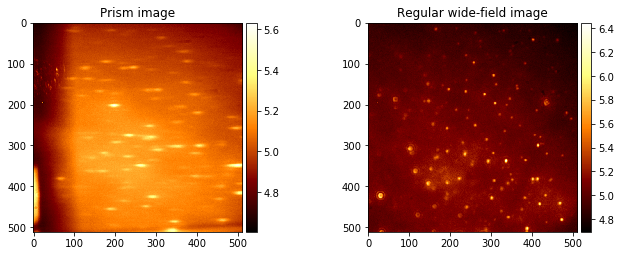

In [8]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
image = movie_prism.mean(0)
fig, ax = plt.subplots(1,2, figsize=(10,5))
im0 = ax[0].imshow(np.log(image), interpolation='None', cmap='afmhot')
im1 = ax[1].imshow(np.log(movie_dot.mean(0)), interpolation='None', cmap='afmhot')
ax[0].set_title('Prism image')
ax[1].set_title('Regular wide-field image')

divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im0, cax=cax)
divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im1, cax=cax)
plt.subplots_adjust(wspace = 0.5) 

## Background correction using Gaussian filter

##### Exam image profile after filtering; Tune sigma

In [9]:
sigma = 30
movie_LPed = np.zeros(data)
for i in range(data[0]):
    movie_LPed[i,:,:] = ndi.gaussian_filter(movie_prism[i,:,:], sigma)
movie_HPed = movie_prism - movie_LPed

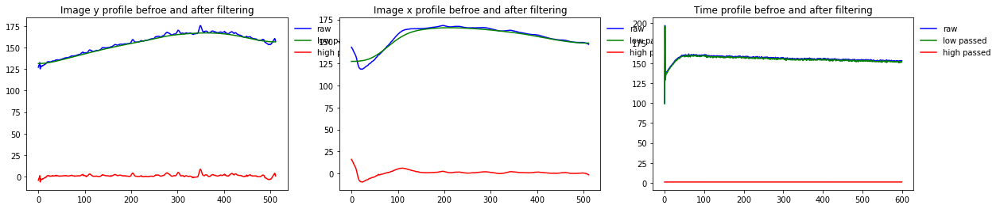

In [10]:
fig, ax = plt.subplots(1,3, figsize=(20,4))
ax[0].plot(movie_prism.mean(0).mean(1), 'b', label='raw')
ax[0].plot(movie_LPed.mean(0).mean(1), 'g', label='low passed')
ax[0].plot(movie_HPed.mean(0).mean(1), 'r', label='high passed')
ax[0].set_title('Image y profile befroe and after filtering')
ax[0].legend(frameon=False, bbox_to_anchor=(1,1))

ax[1].plot(movie_prism.mean(0).mean(0), 'b', label='raw')
ax[1].plot(movie_LPed.mean(0).mean(0), 'g', label='low passed')
ax[1].plot(movie_HPed.mean(0).mean(0), 'r', label='high passed')
ax[1].set_title('Image x profile befroe and after filtering')
ax[1].legend(frameon=False, bbox_to_anchor=(1,1))

ax[2].plot(movie_prism.mean(1).mean(1), 'b', label='raw')
ax[2].plot(movie_LPed.mean(1).mean(1), 'g', label='low passed')
ax[2].plot(movie_HPed.mean(1).mean(1), 'r', label='high passed')
ax[2].set_title('Time profile befroe and after filtering')
ax[2].legend(frameon=False, bbox_to_anchor=(1,1))

##### Prism Movie after filtering

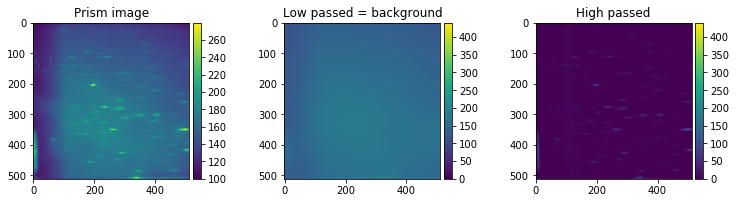

In [11]:
L = np.mean(movie_LPed, axis=0)
H = np.mean(movie_HPed, axis=0)
im = {}
fig, ax = plt.subplots(1,3, figsize=(12,4))
im['0'] = ax[0].imshow(image)
im['1'] = ax[1].imshow(L, vmin=0, vmax=440)
im['2'] = ax[2].imshow(H, vmin=0, vmax=440)
ax[0].set_title('Prism image')
ax[1].set_title('Low passed = background')
ax[2].set_title('High passed')

for i in range(3):
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(im[str(i)], cax=cax)
plt.subplots_adjust(wspace = 0.5) 

In [12]:
sigma = 20
movie_dot_LPed = np.zeros(movie_dot.shape)
for i in range(movie_dot.shape[0]):
    movie_dot_LPed[i,:,:] = ndi.gaussian_filter(movie_dot[i,:,:], sigma)
movie_dot_HPed = movie_dot - movie_dot_LPed

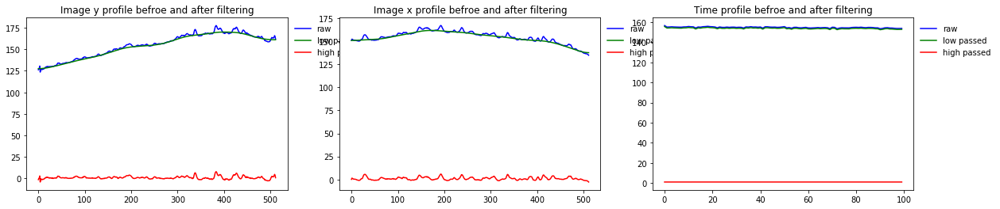

In [13]:
fig, ax = plt.subplots(1,3, figsize=(20,4))
ax[0].plot(movie_dot.mean(0).mean(1), 'b', label='raw')
ax[0].plot(movie_dot_LPed.mean(0).mean(1), 'g', label='low passed')
ax[0].plot(movie_dot_HPed.mean(0).mean(1), 'r', label='high passed')
ax[0].set_title('Image y profile befroe and after filtering')
ax[0].legend(frameon=False, bbox_to_anchor=(1,1))

ax[1].plot(movie_dot.mean(0).mean(0), 'b', label='raw')
ax[1].plot(movie_dot_LPed.mean(0).mean(0), 'g', label='low passed')
ax[1].plot(movie_dot_HPed.mean(0).mean(0), 'r', label='high passed')
ax[1].set_title('Image x profile befroe and after filtering')
ax[1].legend(frameon=False, bbox_to_anchor=(1,1))

ax[2].plot(movie_dot.mean(1).mean(1), 'b', label='raw')
ax[2].plot(movie_dot_LPed.mean(1).mean(1), 'g', label='low passed')
ax[2].plot(movie_dot_HPed.mean(1).mean(1), 'r', label='high passed')
ax[2].set_title('Time profile befroe and after filtering')
ax[2].legend(frameon=False, bbox_to_anchor=(1,1))

##### Dot movie after filtering

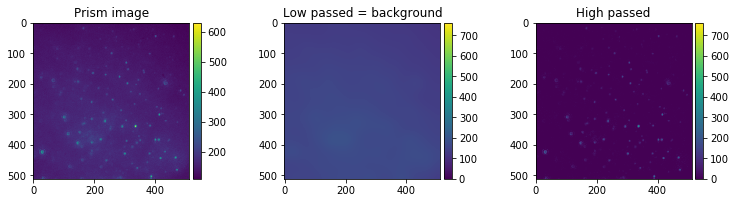

In [14]:
L = np.mean(movie_dot_LPed, axis=0)
H = np.mean(movie_dot_HPed, axis=0)
im = {}
fig, ax = plt.subplots(1,3, figsize=(12,4))
im['0'] = ax[0].imshow(movie_dot.mean(0))
im['1'] = ax[1].imshow(L, vmin=0, vmax=760)
im['2'] = ax[2].imshow(H, vmin=0, vmax=760)
ax[0].set_title('Prism image')
ax[1].set_title('Low passed = background')
ax[2].set_title('High passed')

for i in range(3):
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(im[str(i)], cax=cax)
plt.subplots_adjust(wspace = 0.5) 

## Find dots' and lines' coordinates

In [15]:
import ROI

In [16]:
scan = [3,3]
pts_dot = ROI.finddot(movie_dot_HPed.mean(0), scan, nstd=1.4)
scan = [3,10]
pts_prism = ROI.finddot(movie_HPed.mean(0), scan, nstd=1.3)

In [17]:
print(pts_dot.shape, pts_prism.shape)

(93, 2) (49, 2)


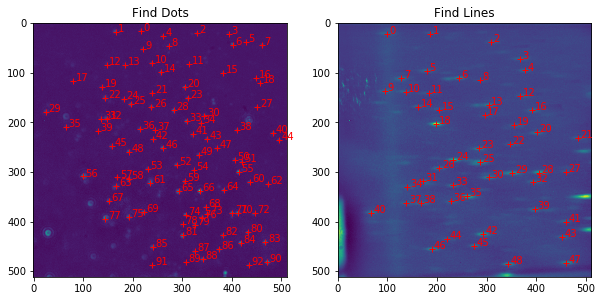

In [18]:
fig, ax = plt.subplots(1,2, figsize=(10,5))
ax[0].set_title('Find Dots')
for count, pt in enumerate(pts_dot):
    ax[0].plot(pt[0],pt[1], 'r+')
    ax[0].annotate(count, xy=pt+[5,0], color='r')
ax[0].imshow(movie_dot_HPed.mean(0), interpolation='None')
ax[1].set_title('Find Lines')
for count, pt in enumerate(pts_prism):
    ax[1].plot(pt[0],pt[1], 'r+')
    ax[1].annotate(count, xy=pt+[5,0], color='r')
ax[1].imshow(movie_HPed.mean(0), interpolation='None')

### ROI after background subtraction

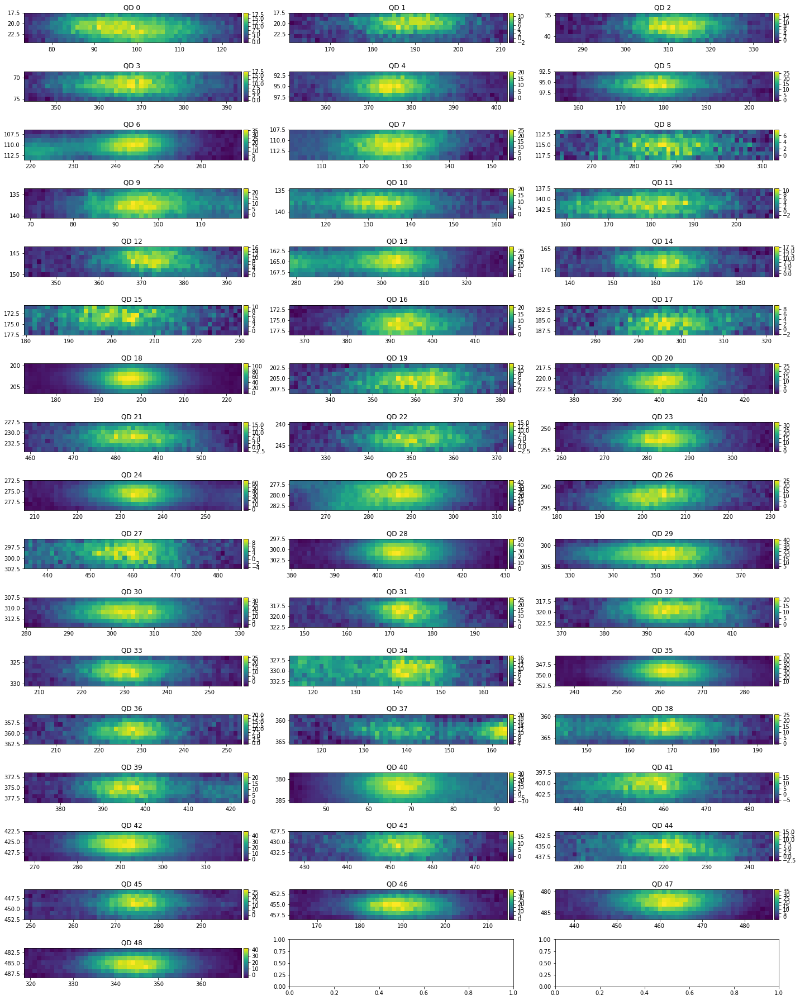

In [19]:
scan = [scan[0],scan[1]+15]
import math
fig, ax = plt.subplots(int(math.ceil(float(len(pts_prism))/3)), 3, figsize=(20,math.ceil(float(len(pts_prism))/2)))
ax = ax.ravel()
for count, pt in enumerate(pts_prism):    
    roi = ROI.get_roi_square(pt, scan)
    
    extent = (roi[1].start-0.5, np.min([roi[1].stop-0.5, 512]), np.min([roi[0].stop-0.5, 512]), roi[0].start-0.5)
    
    im = ax[count].imshow(movie_HPed.mean(0)[roi], interpolation='none', extent=extent)
    ax[count].set_title('QD {} '.format(count))
    divider = make_axes_locatable(ax[count])
    cax = divider.append_axes("right", size="2%", pad=0.05)
    fig.colorbar(im, cax=cax)  
fig.tight_layout()
#plt.subplots_adjust(hspace = 0.6) 

fig, ax = plt.subplots(figsize=(20,2))
ax.plot(movie_prism.mean(1).mean(1))
ax.set_xlim(135,175)
fig, ax = plt.subplots(8,5, figsize=(20,20))
ax = ax.ravel()
for m in range(40):
    ax[m].imshow(movie_prism[135+m], vmin=0, vmax=600)
    ax[m].set_title('{}'.format(135+m))

### Time traces after background correction

In [20]:
show_tt = 1 #Choose to show time trace or not

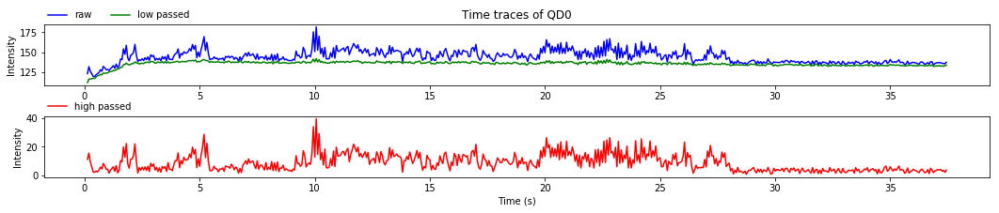

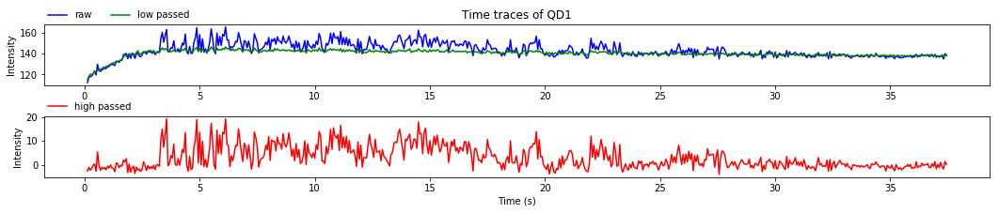

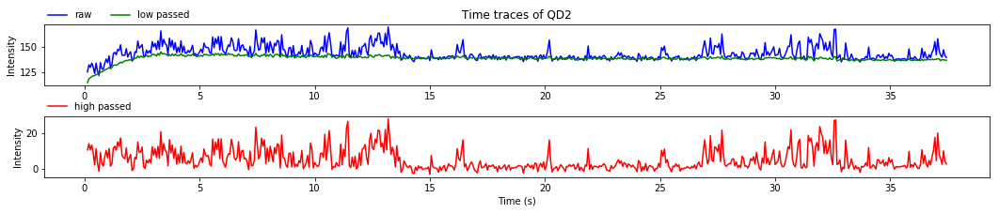

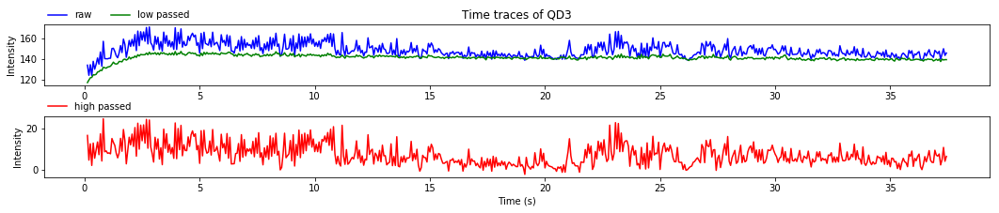

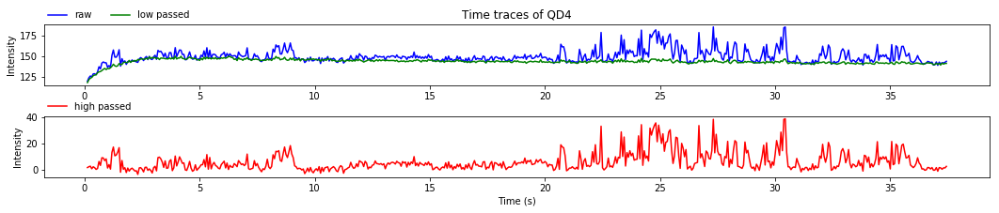

...

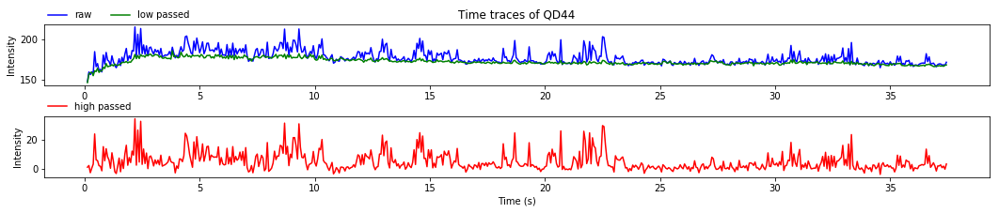

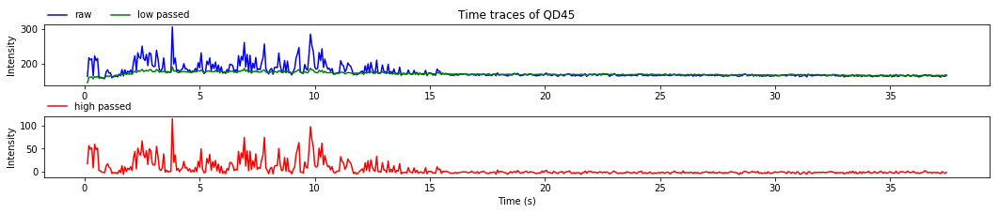

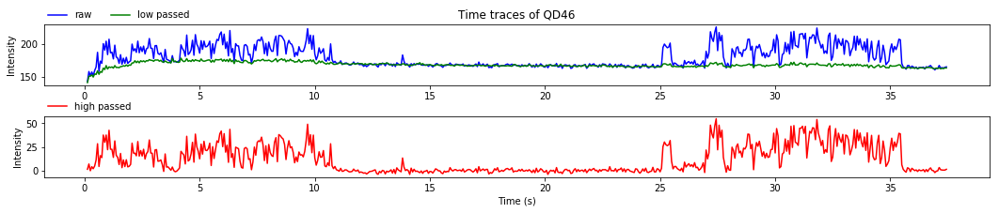

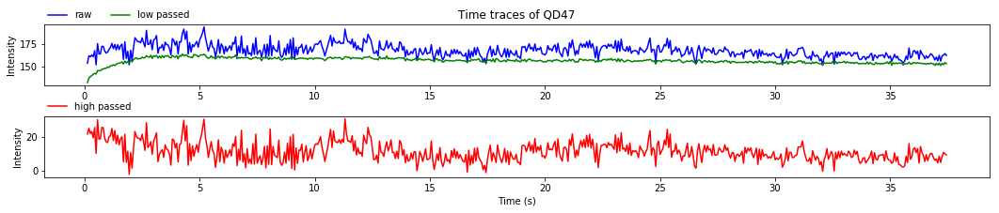

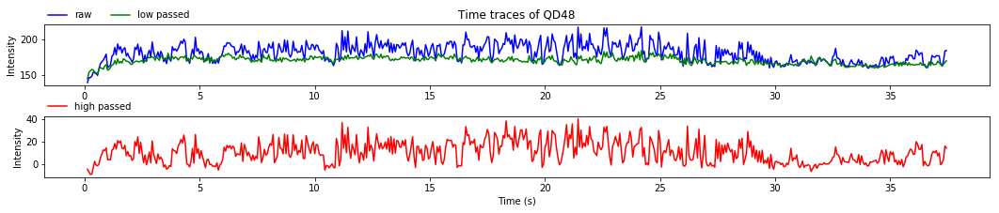

In [21]:
if show_tt == 1:
    T = np.arange(0,data[0]/framerate, 1/framerate)
    frame_start = 2
    for count, pt in enumerate(pts_prism):
        fig, ax = plt.subplots(2,1, figsize=(18,3))
        ax[0].plot(T[frame_start:], ROI.get_timetrace(movie_prism, pt, scan)[frame_start:], 'b', label='raw')
        ax[0].plot(T[frame_start:], ROI.get_timetrace(movie_LPed, pt, scan)[frame_start:], 'g', label='low passed')
        ax[1].plot(T[frame_start:], ROI.get_timetrace(movie_HPed, pt, scan)[frame_start:], 'r', label='high passed')
        ax[1].set_xlabel('Time (s)')
        ax[0].set_ylabel('Intensity')
        ax[1].set_ylabel('Intensity')
        ax[0].set_title('Time traces of QD{}'.format(count))
        ax[0].legend(bbox_to_anchor=(0., 1.01, 1., .101), loc=3,
                   ncol=2, borderaxespad=0., frameon=False)
        ax[1].legend(bbox_to_anchor=(0., 1.01, 1., .101), loc=3,
                   ncol=2, borderaxespad=0., frameon=False)
        plt.subplots_adjust(hspace = 0.5)
        plt.close(fig)
        display(fig)

## Calibrate wavelength

##### Find dx and dy

In [22]:
x_shift, y_shift, mag = (30 ,-60.918637535924951, 0.90703524833602123)
dot = (pts_dot+[x_shift,y_shift])/[1,mag]

    Dot  Prism    weighted dr
0    12      0   63160.247709
1    12      1    7567.247709
2    14      2    9159.993754
3    20      3   15065.284636
4    23      4   22657.001871
5    22      5    3281.921524
6    25      6    6960.916090
7    25      7   87925.933350
8    26      8   14059.510079
9    29      9   52879.329366
10   31     10   34638.713510
11   32     11    7952.652985
12   33     12   13302.320546
13   37     13   22414.116586
14   39     14   10432.899333
15   39     15   20532.343273
16   41     16   29505.360000
17   42     17   19540.123462
18   45     18    7525.512564
19   47     19   30439.210526
20   49     20   28610.194602
21   50     21   35651.340824
22   52     22   23636.576901
23   53     23   20202.587998
24   58     24    6601.862744
25   59     25   33577.944359
26   63     26    8487.310809
27   64     27   30467.723952
28   64     28    3964.541715
29   66     29    9334.126118
30   65     30   21958.213853
31   67     31   58892.003767
32   66   

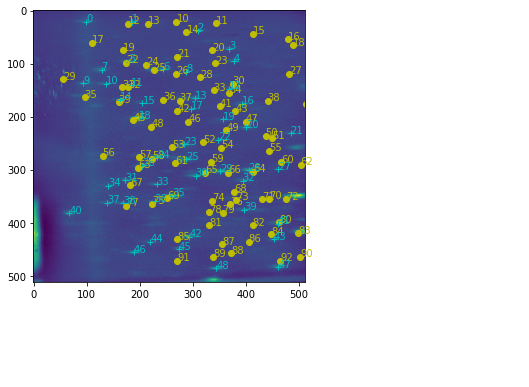

In [23]:
fig, ax = plt.subplots(figsize=(5,5))
for count, pt in enumerate(dot):
    ax.plot(pt[0], pt[1], 'yo')
    ax.annotate(count, xy=pt, color='y')
for count, pt in enumerate(pts_prism):
    ax.plot(pt[0], pt[1], 'c+')
    ax.annotate(count, xy=pt, color='c')
ax.imshow(movie_HPed.mean(0))

Match = pd.DataFrame()
for count, pt in enumerate(pts_prism):
    dot_index = np.argmin(np.sum(((dot-pt)*scan)**2, axis=1))
    DF1 = pd.DataFrame({'Dot':dot_index, 
                        'Prism':count, 
                        'weighted dr':np.amin(np.sum(((dot-pt)*scan)**2, axis=1))}, 
                       index=[count])
    Match = Match.append(DF1)
print(Match)

##### Extract wavelength

In [24]:
w = {}
#w_ex = {}
for i in Match.index:
    if Match['weighted dr'][i] < 5*10**4:
        dx, dy = pts_prism[Match['Prism'][i]]-pts_dot[Match['Dot'][i]]
        #print(i, pts_dot[Match['Dot'][i]][0], dx, scan, 'x')
        wavelength_fromX = ROI.get_wavelength(pts_dot[Match['Dot'][i]][0], dx, scan, 'x')
        #wavelength_withEx = ROI.get_wavelength_extrapolate_fill_nans(pts_dot[Match['Dot'][i]][0], dx, scan, 'x')
        w[i] = wavelength_fromX
        #w_ex[i] = wavelength_withEx

G:\google drive\QCSE analysis script\ROI.py:242: RuntimeWarning: invalid value encountered in sqrt
  wavelength = (-b+np.sqrt(b**2-4*a*(c-dx)))/(2*a)


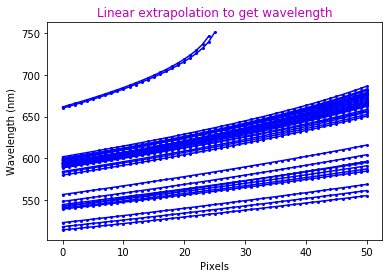

In [25]:
for i in w:
    #plt.plot(w_ex[i], 'm')
    plt.plot(w[i], 'bo-', ms=2)
plt.title('Linear extrapolation to get wavelength', color='m')
plt.xlabel('Pixels')
plt.ylabel('Wavelength (nm)')

for i in w:
    if np.any(np.isnan(w[i])):
        print(i, w[i])

## Extract QD spectra; Plot QCSE results

In [26]:
import QCSE

##### Parameters

In [27]:
frame_start = 2
T = np.arange(0, 1/framerate*data[0], 1/framerate)
w = w

##### Plot results

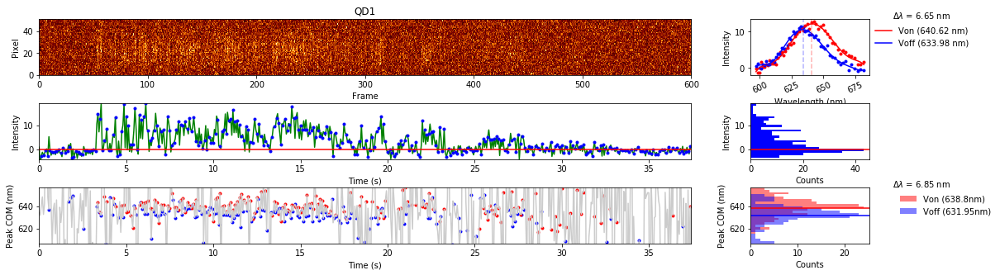

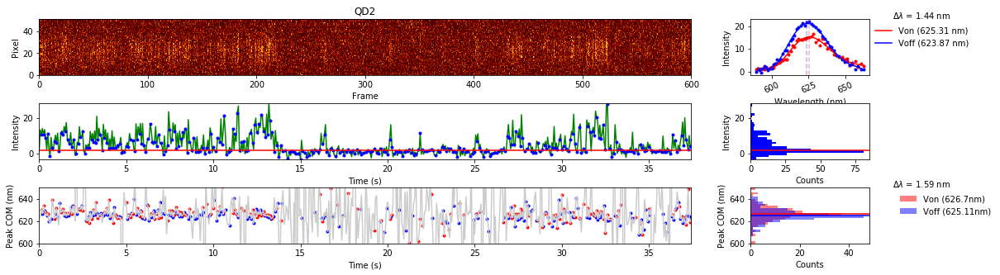

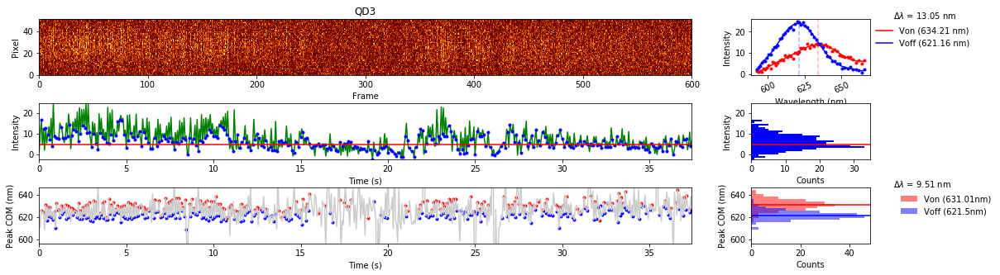

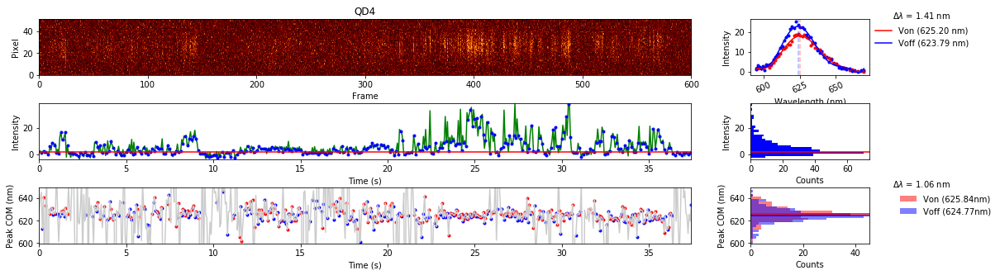

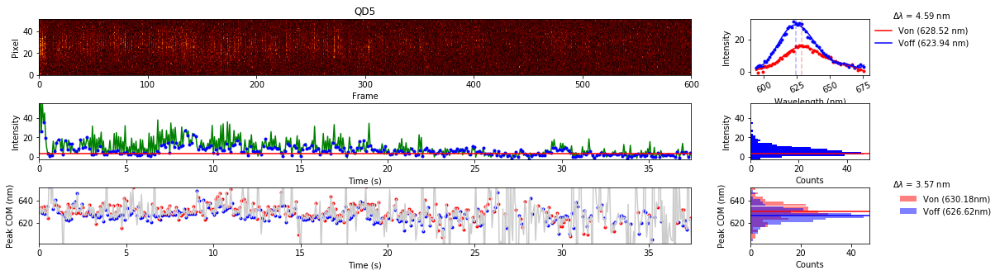

...

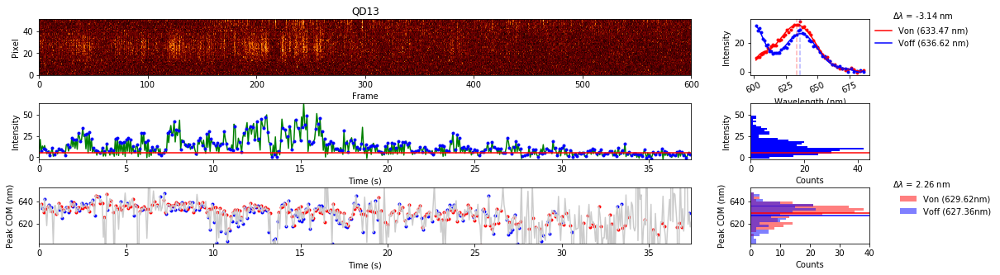

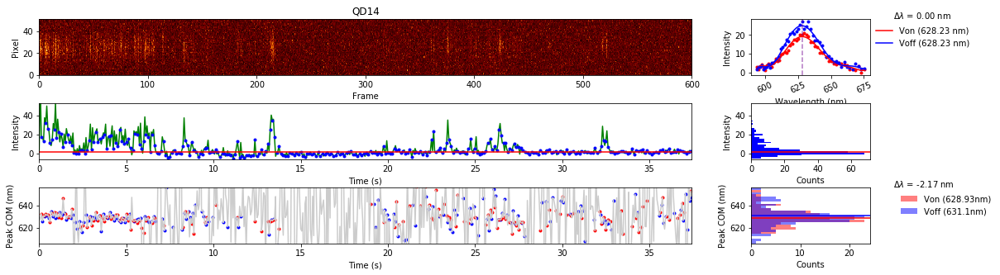

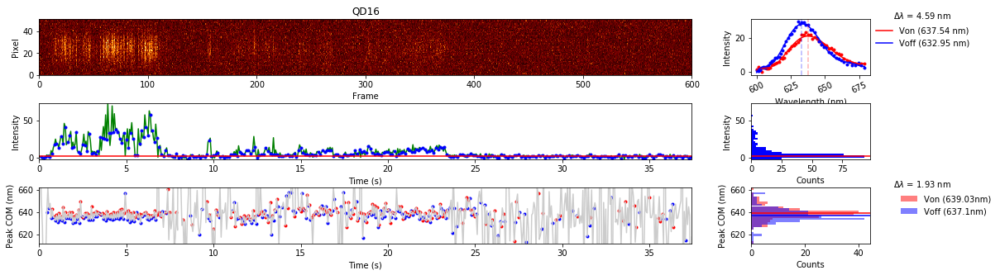

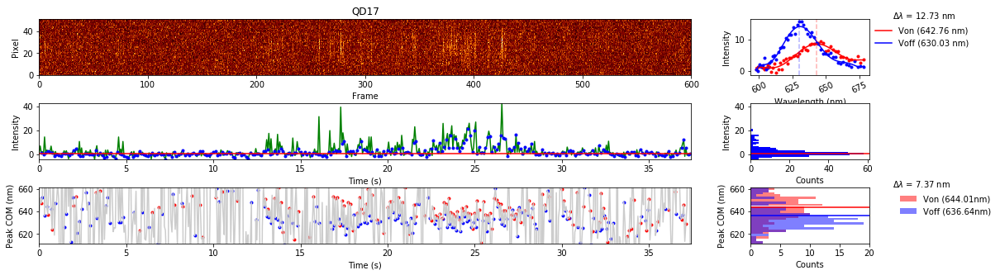

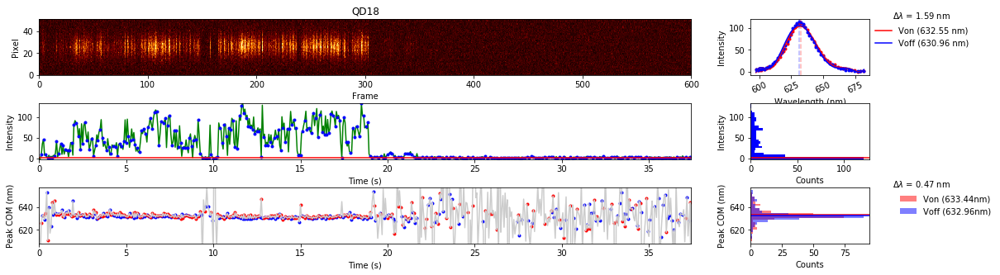

C:\Users\NewQCSE\Anaconda3\lib\site-packages\numpy\lib\polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)
C:\Users\NewQCSE\Anaconda3\lib\site-packages\numpy\lib\polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


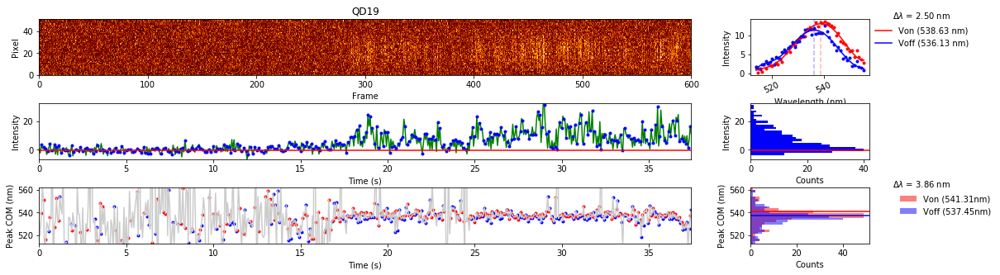

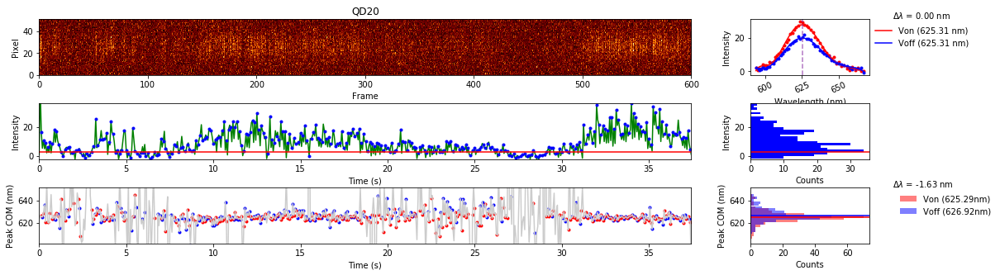

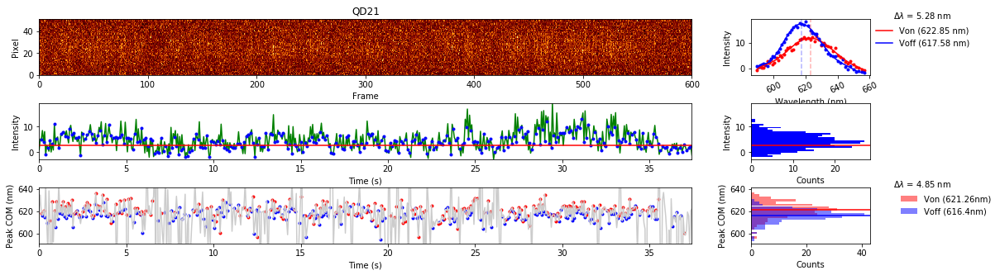

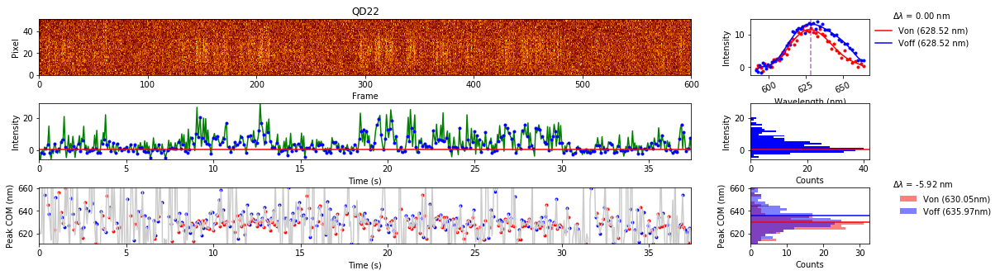

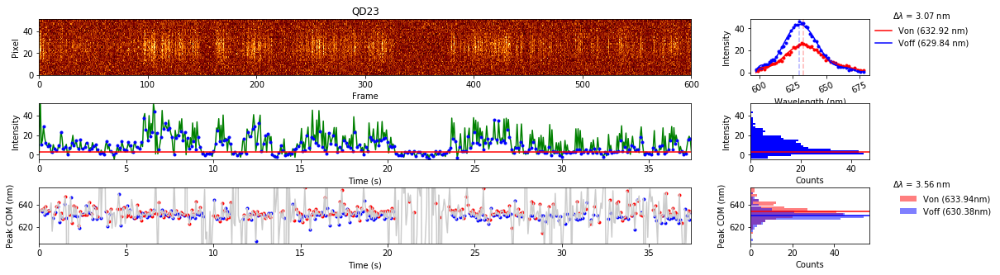

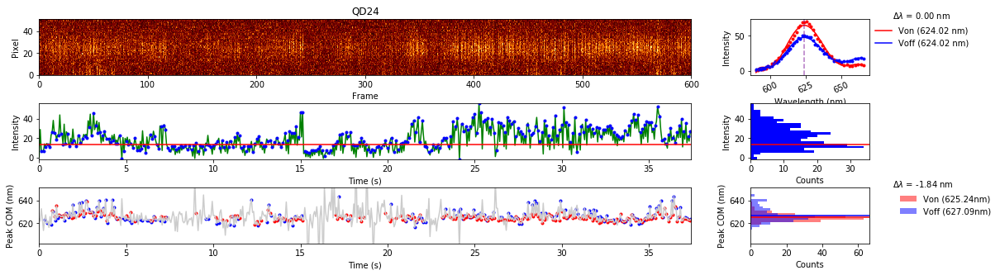

C:\Users\NewQCSE\Anaconda3\lib\site-packages\numpy\lib\polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)
C:\Users\NewQCSE\Anaconda3\lib\site-packages\numpy\lib\polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


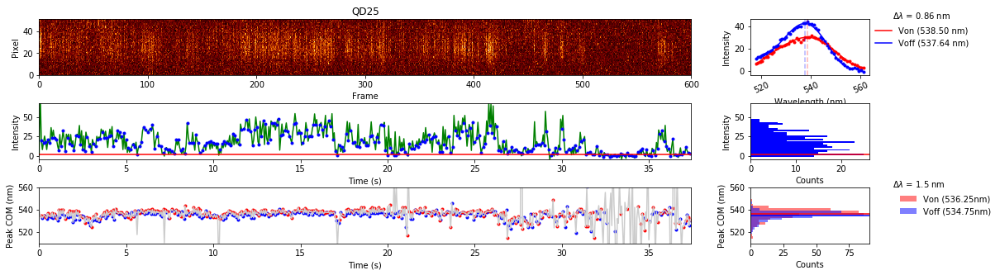

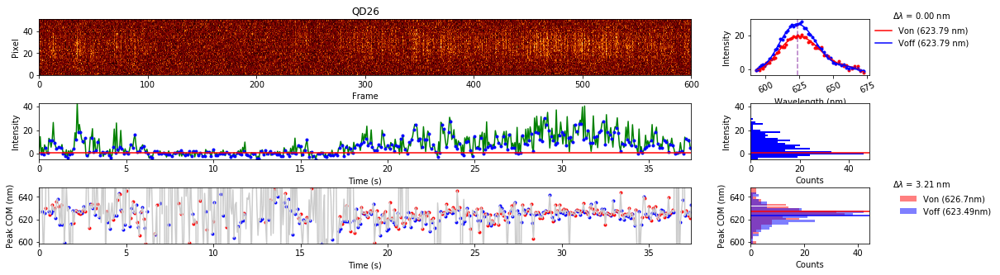

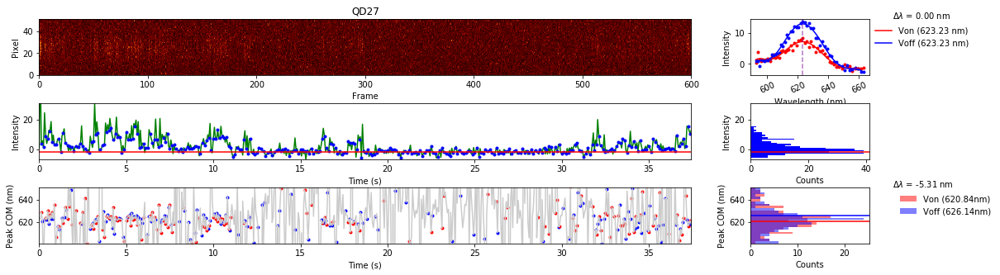

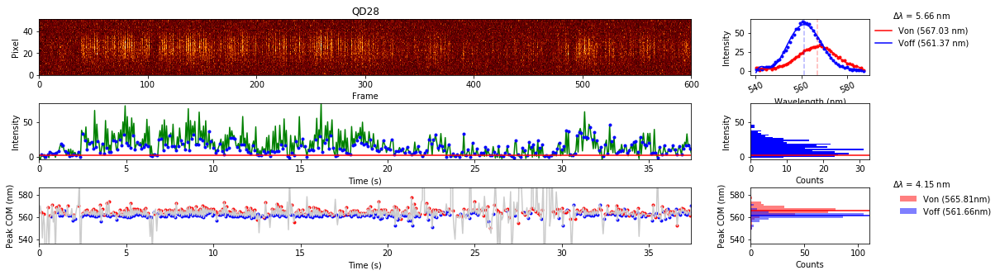

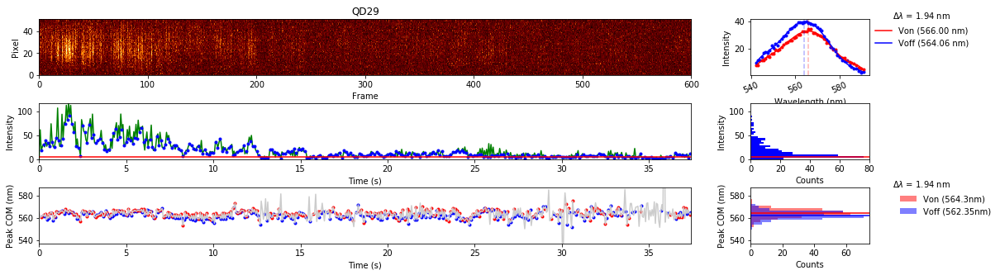

...

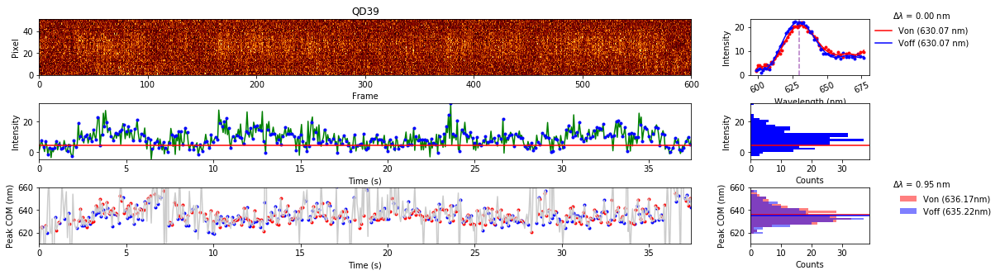

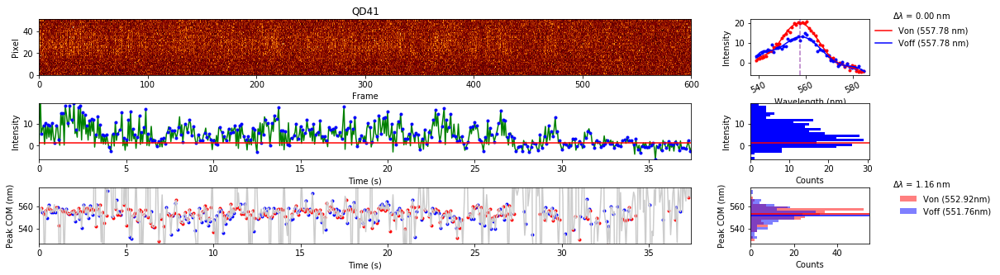

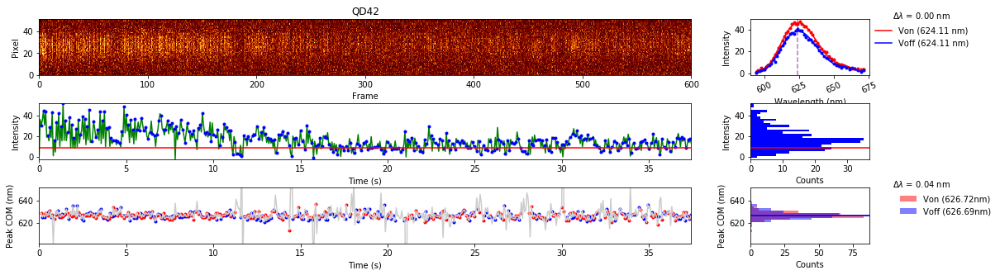

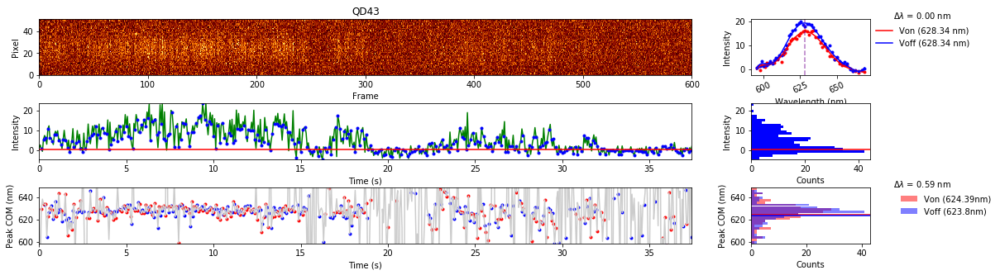

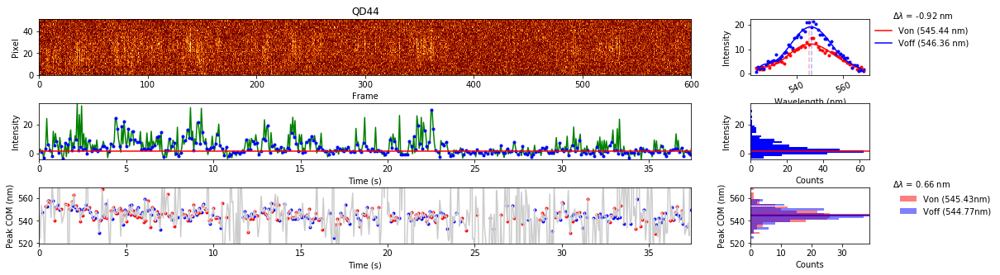

In [28]:
dL = pd.DataFrame()
for count, pt in enumerate(pts_prism):
    if Match['weighted dr'][count] < 5*10**4 and np.isnan(w[count]).any() == False:
        if np.logical_and(pt[0]+scan[1]<512, pt[0]-scan[1]>0) and np.logical_and(pt[1]+scan[0]<512, pt[1]-scan[0]>0):
            threshold = ROI.get_blinking_threshold(movie_HPed[frame_start::2,:,:], pt, scan, frame_start, 15, 1.3)
            fig, dL1 = QCSE.plot_QCSE_report(movie_HPed, pt, scan, w[count], T, count, threshold, frame_start=frame_start)
            dL = dL.append(dL1)
            plt.close(fig)
            display(fig)

plt.plot(dL.index, C1, 'o')
plt.plot(dL.index, C2, 'o')
#plt.ylim(0,200)

In [29]:
dL.to_csv(filePath+'results/'+fileName1+'_result.csv')
dL[:5]
#dL.to_pickle(filePath+'results/'+fileName1+'_result.pkl')

,Loff,Loff_COM,Lon,Lon_COM,dE (meV),dE_COM (meV),dF/F,dL,dL_COM
1,633.975106,631.952629,640.622612,638.798924,-20.295791,-21.029482,0.245652,6.647506,6.846295
2,623.866659,625.107994,625.310129,626.701568,-4.588199,-5.044035,-0.213601,1.443470,1.593574
3,621.160557,621.499615,634.210368,631.011714,-41.076054,-30.075976,-0.306974,13.049812,9.512098
4,623.785820,624.772798,625.197970,625.837341,-4.490035,-3.375993,-0.149042,1.412151,1.064544
5,623.936307,626.618293,628.524495,630.183568,-14.507760,-11.195526,-0.424642,4.588187,3.565274


### Plot spectra of selected QD in selected frames

In [30]:
show_zoomed_region = False
count = 8
frame_period = [200,300]

In [31]:
if show_zoomed_region:
    QCSE.plot_zoomed_region(movie_HPed, pts_prism[count], scan, w[count], frame_period, frame_start=2,)

### Plot big figure

In [32]:
show_big_figure = False
count = 13
name = 'Big_figure_pt%d' % count

In [33]:
if show_big_figure:
    QCSE.plot_big_figure(movie_HPed, pts_prism[count], scan, w[count], name, frame_start=2)